# Using Perceptual Loss Functions for Optimisation

This notebook will give an overview of the concept of a perceptual loss function, and show examples of applying the image-based perceptual loss functions implemented in Odak.

## What is a Perceptual Loss?

A perceptual loss is a loss function which is designed to only penalise deviations from a target that are perceivable by a human in specified conditions. 

Given the correct application, perceptual losses can have two main advantages over more direct loss functions such as L2:

1. Perceptual losses converge to results that are perceptually closest to a target (rather than closest under L2 for example).
2. Perceptual losses can enable faster convergence to a perceptually acceptable solution.

We consider the first point to be the most important. Perceptual losses can expand the solution space by allowing any stimulus perceived the same as the target. This is particularly beneficial in challenging domains such as computer generated holography, where achieving an exact, artefact-free match to a target may not be possible.

## Foveated Losses

One important class of perceptual losses focuses on vision, and in particular the drop in visual acuity as one move away from a user's fovea.

We will introduce two losses of this kind here. The first matches the image to a copy of the target to which a foveated blur has been applied. The second only enforces that the low-frequency content in the image match the target.

## Initial setup

We will begin by loading the libraries we will use, and then load a target image.


In [16]:
import odak
import torch
import matplotlib.pyplot as plt

# Select the pytorch device to use. If you don't have a CUDA enabled GPU uncomment the CPU option below.
device = torch.device("cuda")
#device = torch.device("cpu")

target_image = odak.tools.load_image("images/image.jpg")

def numpy_to_torch(image):
    # Convert an 8-bit numpy image to floating point and standard pytorch NCHW format.
    return torch.tensor(target_image, device=device).permute(2,0,1).float()[None,...] / 255

def torch_to_numpy(image):
    # Move a pytorch floating-point image back to CPU if necessary and reformat for display.
    return torch.clamp(image[0,...], 0, 1).permute(1,2,0).cpu().detach().numpy()

target_image = numpy_to_torch(target_image)

We'll now optimise using the first loss discussed above, which enforces the image to match a low-frequency version of the target image.

The losses provided in Odak function in the same way as the built-in loss functions in pytorch, so we set up a standard optimization loop using the Adam optimizer.

The function below initialises with a random noise image, and optimises it to match the target image under the given loss function.

In [22]:
from odak.learn.perception import BlurLoss

def optimize_with_loss(target_image, loss_function, num_iterations=100, gaze=[0.5,0.5]):

    # Initialise with an image containing uniform random noise in the range [0,1]
    image = torch.rand_like(target_image, requires_grad=True)

    # Calculate and print the initial loss
    loss = loss_function(image, target_image)
    print("Initial loss:", loss.item())

    # Create an Adam optimizer, set the image as the parameter to optimize.
    optimizer = torch.optim.Adam([image], lr=0.2)

    # Optimization loop:
    for iter in range(num_iterations):
        optimizer.zero_grad() # Clear gradients from previous iteration
        loss = loss_function(image, target_image, gaze=gaze) # Compute loss
        loss.backward() # Back-propagate to find gradients
        optimizer.step() # Perform optimizer step given gradients.

    print("Final loss:", loss.item())

    # Plot the target and final output side-by-side
    figure = plt.figure(figsize=[20,10])
    axes_1 = figure.add_subplot(121)
    axes_1.imshow(torch_to_numpy(target_image))
    axes_2 = figure.add_subplot(122)
    axes_2.imshow(torch_to_numpy(image))
    plt.show()

    return image

Initial loss: 0.1540544331073761
Final loss: 1.693741069175303e-06


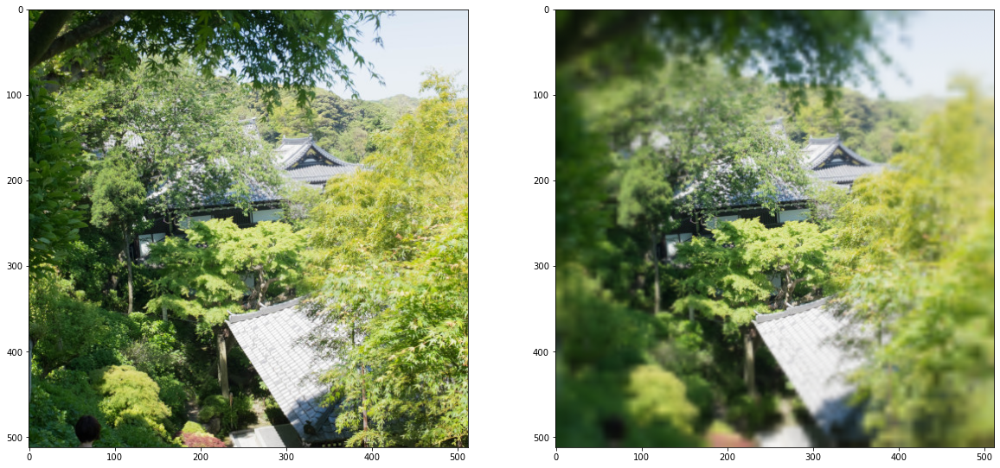

In [23]:
blur_loss = BlurLoss()
blur_loss_image = optimize_with_loss(target_image, blur_loss)

Since foveated loss functions are gaze contingent, it is important to supply the correct gaze location. Note that in the example above this was set to `[0.5, 0.5]` - the center of the image. We can change this to move the fixation point:

Initial loss: 0.15442390739917755
Final loss: 1.6594540284131654e-06


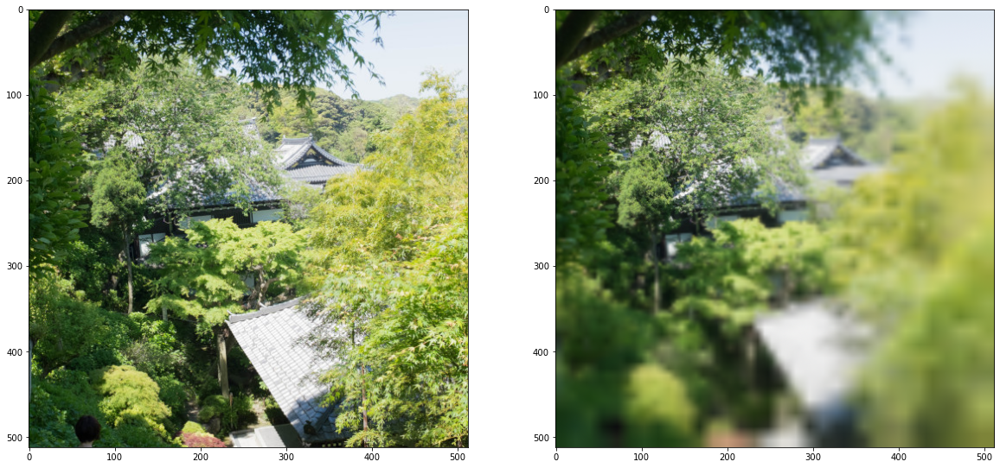

In [24]:
blur_loss_image = optimize_with_loss(target_image, blur_loss, gaze=[0.25,0.25]) # Set fixation point to top left of image.

The losses provided in Odak have a configurable parameter `alpha` which controls the strength of the foveation effect. They also have user-controllable settings for viewing distance and image width, designed to allow consistent results when images are vieweds on a 2D screen under different conditions.

In the example below the viewing distance has been increased from the default value. Since more of the image will fall inside the fovea of the viewer at this distance, the image is enforced to be similar to the target over a wider region of the image.

Initial loss: 0.16005977988243103
Final loss: 1.758525058903615e-06


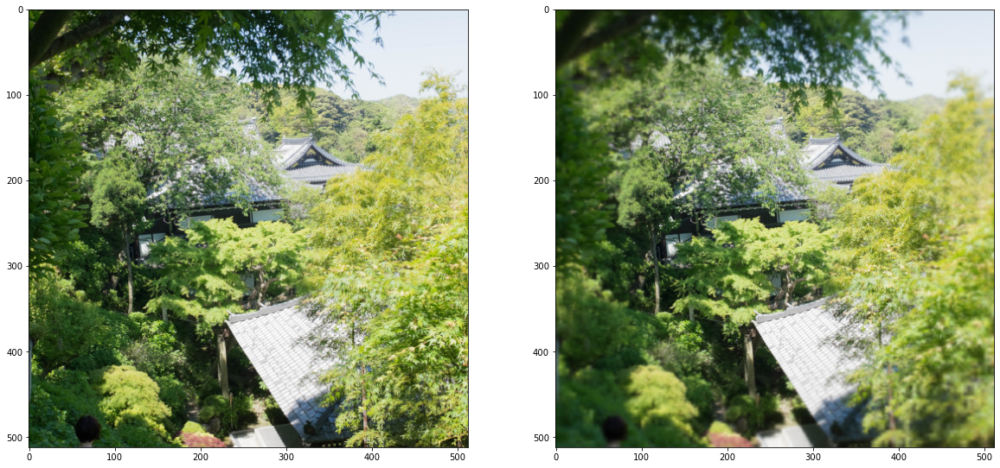

In [25]:
blur_loss_closer = BlurLoss(real_viewing_distance=1.1) # Increase from the default viewing distance of 0.7
blur_loss_image = optimize_with_loss(target_image, blur_loss_closer)

The above losses enforced that the optimized image exactly match a blurred version of the target. This is arguably overly restrictive - in principle only the low frequencies of the image need to match the target. For points in the image at sufficient eccentricity, only these low frequencies can be perceived. 

By setting `blur_source=True` the `BlurLoss` will only match the low frequency content in the periphery. Since the image was initialized with noise, this noise will remain in the image.

Initial loss: 0.08448078483343124
Final loss: 1.673295059845259e-06


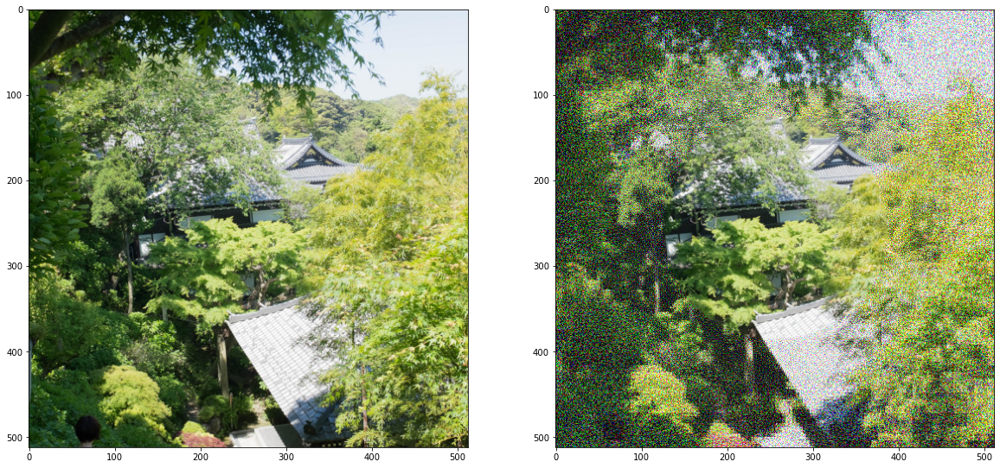

In [26]:

blur_loss_lowfreq = BlurLoss(blur_source=True)

blur_loss_image = optimize_with_loss(target_image, blur_loss_lowfreq)

This loss can be used to only restrict an image to match frequencies which are perceivable to the view due to the drop in visual acuity with distance. This widens the space of possible solutions. In applications such as computer-generated holography, such losses can be used to allow artefacts such as noise to appear only where they cannot be perceived.

The foveation in the above example may appear too strong. Below I have adjusted the image width and viewing distance to be consistent with my current screen - I am viewing the image at a size of 0.1m from a distance of 0.8m. Try adjusting these settings to match your current viewing setup. Note that units do not matter here, as long as the units used for image width and viewing distance are the same (only the ratio of the two is used). 

Initial loss: 0.1100451797246933


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Final loss: 2.4681941113158246e-07


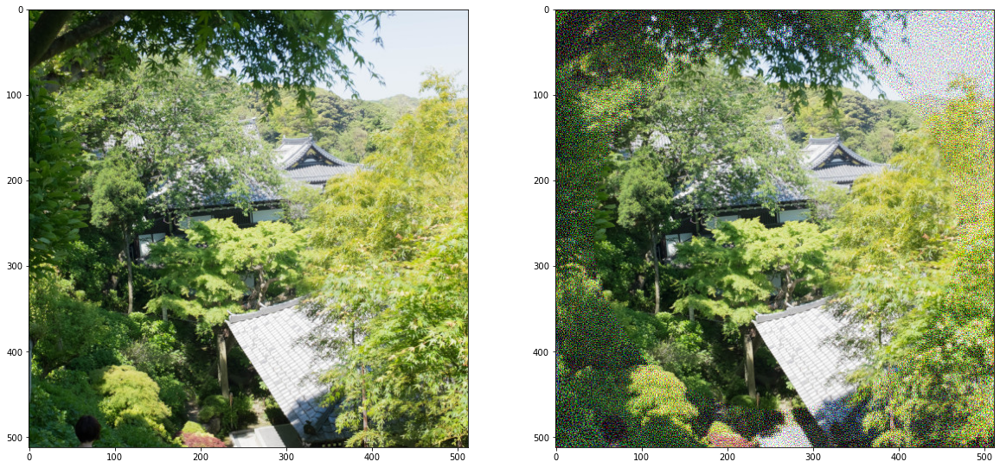

In [89]:

blur_loss_lowfreq = BlurLoss(blur_source=True, real_image_width=0.1, real_viewing_distance=0.8)

blur_loss_image = optimize_with_loss(target_image, blur_loss_lowfreq)

## Visual Pooling

We have so far focused on the drop in visual acuity resulting from the corresponding drop in retinal cell density. However, another important process affecting human perception of images is pooling. The human visual system pools statistics of features over regions of the visual field. These regions grow with eccentricity, and the effect can be stronger 

[Metamers](https://www.nature.com/articles/nn.2889) are pairs of images where the statistics in these pooling regions are equal, although the raw intensity values of the images may differ. Metamers to a particular image form a level set in the space of images - a subspace of images perceived identical. Where gaze location is known, any point in this level set may be an acceptable solution.

The image below shows an example of a metamer generated using [this perceptual model](https://vr-unity-viewer.cs.ucl.ac.uk/). The fixation point is indicated by the red dot. The right half shows the original target image, and the left shows one possible metamer to this image.

![Metamer Example](images/metamer_example.jpg)

By developing a loss function which takes pooling into account, we can further expand the set of acceptable solutions.


## Metameric Loss

The metameric loss is an adaptation of the perceptual model from the 2021 paper [Beyond Blur](https://vr-unity-viewer.cs.ucl.ac.uk/) on metameric image generation and rendering.

It uses the same visual statistics as in this paper, but reformulates the process as a differentiable loss function.

These are local means and variances of a [steerable pyramid](https://www.cns.nyu.edu/~eero/steerpyr/) of the image - this is a representation developed by Simoncelli et al. which decomposes the image into different orientations and scales.

Initial loss: 0.4063776731491089


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Final loss: 1.2611417332664132e-05


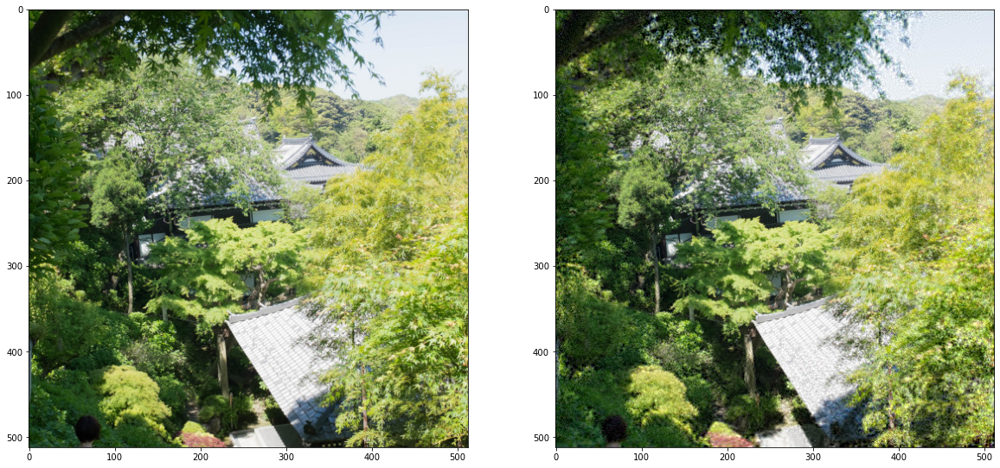

In [88]:
from odak.learn.perception import MetamericLoss

metameric_loss = MetamericLoss(device=device)

metameric_loss_image = optimize_with_loss(target_image, metameric_loss)

The metameric loss only enforces that local means and variances of the steerable pyramid match the target. In this case it has constrained the noise to follow the correct frequency distribution - the right amount of horizontally and vertically oriented noise in each pooling region.

We can increase alpha to further increase the foveation effect and make this more apparent:

Initial loss: 0.3423086702823639


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Final loss: 1.1900487152161077e-05


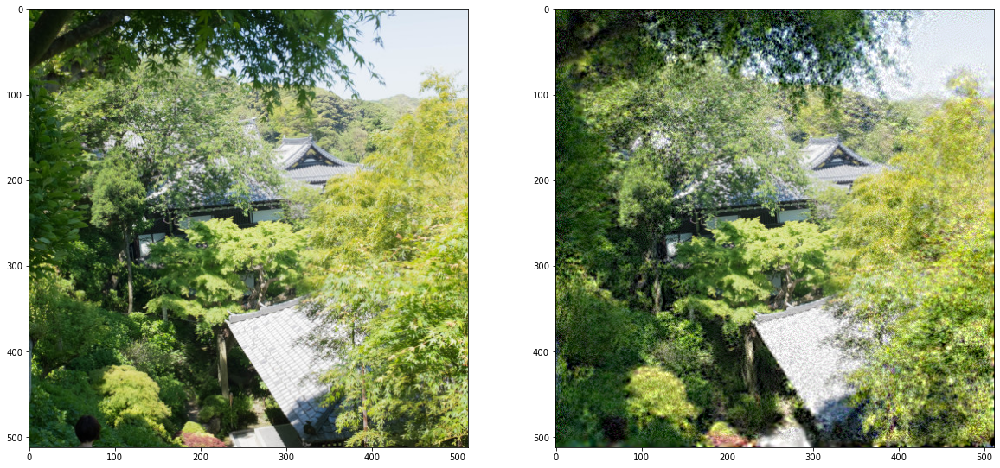

In [87]:

metameric_loss = MetamericLoss(device=device, alpha=0.2)

metameric_loss_image = optimize_with_loss(target_image, metameric_loss)

By capturing an additional perceptual property of the visual system, the metameric loss is able to further exapand the space of possible solutions. However this comes at some additional computational cost, as the steerable pyramids and local statistics need to be computed at each iteration. This highlights the need to balance making more sophisticated loss functions which model more perceptual properties and offer more possible convergence targets with computational speed in the chosen application. 

# Practical Application: Hologram Optimisation

We will next show how a phase-only hologram can be optimised using this metameric loss function. For simplicity here we focus on a single-wavelength case, but note that full-colour RGB holograms can also be optimised - please see the [complight/metameric_holography](https://github.com/complight/metameric_holography) repository for more on this.

We first import the necessary functions from `odak` and set up the parameters of our holographic display. The optimisation code here is structured similarly to the example shown above, but this time we simulate the operation of the SLM in the forward pass.

The below optimisation may take around 1 minute to complete, depending on your available hardware. For longer optimisations like this it can be helpful to use a library like `tqdm` to track progress, as shown in the presentation. This was omitted here as it does not seem to "play nicely" with Jupyter.

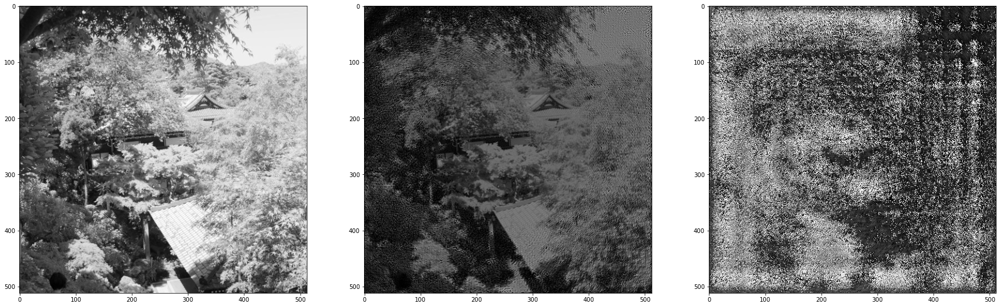

In [30]:

import torch
from odak.learn.wave import calculate_phase, calculate_amplitude, wavenumber, propagate_beam, set_amplitude, generate_complex_field
from odak.learn.tools import zero_pad, crop_center, save_image, load_image
from odak.learn.perception import MetamericLoss
from odak import np

wavelength = 515e-9 # 515nm green light
k = wavenumber(wavelength)
dx = 0.000008 # pixel spacing of SLM
distance = 0.15 # propagation distance
slm_range = 2*np.pi # phase modulation range of SLM
dynamic_range = 255
target_green = target_image[0,1,:,:] # Here we extract the green channel of the target.
propagation_type = "TR Fresnel"
num_iterations = 400

# Set up the inputs to the holographic display. We'll optimise the phase values, so these need to have `requires_grad` set.
amplitude = torch.ones_like(target_green)
phase = torch.rand_like(target_green, requires_grad=True)

# Make an Adam optimiser with the phase as its parameter
optim = torch.optim.Adam(params=[phase], lr=0.1)

# Create the loss function
loss_function = MetamericLoss(device=device, alpha=0.06, real_image_width=0.2, real_viewing_distance=0.7)

for i in range(num_iterations):
    optim.zero_grad()

    # SLM simulation
    hologram = generate_complex_field(amplitude, phase)
    hologram_padded = zero_pad(hologram)
    recon_field = propagate_beam(hologram_padded, k, distance, dx, wavelength, propagation_type)
    recon_field_cropped = crop_center(recon_field)
    recon_intensity = calculate_amplitude(recon_field_cropped)**2

    # Find loss and update.
    loss = loss_function(recon_intensity[None,None,...], target_green[None,None,...], gaze=[0.5, 0.5])
    loss.backward()
    optim.step()
    
# Compute the final output.
hologram_padded = zero_pad(hologram)
reconstruction = propagate_beam(hologram_padded, k, distance, dx, wavelength, propagation_type)
reconstruction = crop_center(reconstruction)
reconstruction_amp = calculate_amplitude(reconstruction)
reconstruction_intensity = (reconstruction_amp/reconstruction_amp.max())**2

# Prepare the phase hologram for display.
phase_hologram = calculate_phase(hologram)
phase_only_hologram = (phase_hologram%slm_range)/slm_range*dynamic_range

# Display final results: Target | Reconstructed Intensity | SLM Phase Map
figure = plt.figure(figsize=[30,10])
axes_1 = figure.add_subplot(131)
axes_1.imshow(torch_to_numpy(target_green[None,None,...]), cmap="gray")
axes_2 = figure.add_subplot(132)
axes_2.imshow(reconstruction_intensity.detach().cpu(), cmap="gray", vmin=0, vmax=1)
axes_3 = figure.add_subplot(133)
axes_3.imshow(phase_only_hologram.detach().cpu(), cmap="gray")

Here we have introduced the concept of a perceptual loss, shown some examples of foveated losses including the metameric loss, and given a practical example of using such a loss to optimise the input to a phase-only holographic display. To readers interested in taking this further and exploring holography using perceptual losses in colour, we recommend [our paper](https://ieeexplore.ieee.org/abstract/document/9756777) and [code](https://ieeexplore.ieee.org/abstract/document/9756777) exploring this.